In [2]:
!pip install -q opencv-python scikit-image albumentations

In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path

In [4]:
from pathlib import Path

PROJECT_DIR = Path("/content/histopathology_project")

folders = [
    "data/raw",
    "data/processed",
    "data/patches/images",
    "data/patches/masks",
    "models",
    "results",
    "visualizations"
]

for folder in folders:
    (PROJECT_DIR / folder).mkdir(parents=True, exist_ok=True)

print("Project structure created!")

Project structure created!


In [5]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
DRIVE_PROJECT = Path("/content/drive/MyDrive/Histopathology_Project")

DRIVE_PROJECT.mkdir(parents=True, exist_ok=True)

print(DRIVE_PROJECT)

/content/drive/MyDrive/Histopathology_Project


In [7]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:

import os

print(os.listdir("/content/drive/MyDrive"))

['Classroom', '23ec01033 _P.Chaitanya prabhu.pdf', '23ec01033-P.Chaitanya prabhu.pdf', 'Lecture-4-Imperfections in solids.pdf', '23EC01033_P.Chaitanya prabhu.pdf', 'LTspice64.msi', 'I e tutorial .pdf', 'I e ltspice.zip', '23EC01033_P.CHAITANYA PRABHU_EXPERIMENT 4.pdf', '23EC01033_P.CHAITANYA PRABHU_EXP.5.pdf', '23ec01033 -P.Chaitanya prabhu (1).pdf', '23ec01033 -P.Chaitanya prabhu.pdf', '23EC01033_P.CHAITANYA PRABHU_EXPERIMENT6.pdf', 'ACE Scanner_2024_09_06 (1).pdf', 'ACE Scanner_2024_09_06.pdf', 'TransactionReceipt2919920170675161445.jpeg', 'DOC-20241224-WA0000..pdf', 'Document from Chaitanya Prabhu (13).pdf', 'Document from Chaitanya Prabhu (12).pdf', 'Document from Chaitanya Prabhu (11).pdf', 'Document from Chaitanya Prabhu (10).pdf', 'Document from Chaitanya Prabhu (9).pdf', 'Document from Chaitanya Prabhu (8).pdf', 'Document from Chaitanya Prabhu (7).pdf', 'Document from Chaitanya Prabhu (6).pdf', 'Document from Chaitanya Prabhu (5).pdf', 'Document from Chaitanya Prabhu (4).pdf', 

In [10]:
import os

PROJECT_DIR = "/content/drive/MyDrive/Histopathology_Project (1)"

print(os.listdir(PROJECT_DIR))

['MoNuSeg 2018 Training Data.zip']


In [11]:
import zipfile
import os

zip_path = "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg 2018 Training Data.zip"

extract_path = "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg"

os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Dataset extracted!")

✅ Dataset extracted!


In [12]:
for root, dirs, files in os.walk(extract_path):
    level = root.replace(extract_path, "").count(os.sep)
    indent = "    " * level

    print(indent + os.path.basename(root) + "/")

    for file in files[:5]:
        print("    " * (level + 1) + file)

    if level >= 2:
        dirs[:] = []

MoNuSeg/
    MoNuSeg 2018 Training Data/
        .DS_Store
        Annotations/
            TCGA-38-6178-01Z-00-DX1.xml
            TCGA-HE-7129-01Z-00-DX1.xml
            TCGA-A7-A13E-01Z-00-DX1.xml
            TCGA-FG-A87N-01Z-00-DX1.xml
            TCGA-HE-7128-01Z-00-DX1.xml
        Tissue Images/
            TCGA-G9-6348-01Z-00-DX1.tif
            TCGA-MH-A561-01Z-00-DX1.tif
            TCGA-E2-A1B5-01Z-00-DX1.tif
            TCGA-CH-5767-01Z-00-DX1.tif
            TCGA-AR-A1AS-01Z-00-DX1.tif
    __MACOSX/
        MoNuSeg 2018 Training Data/
            ._.DS_Store
            ._Annotations
            ._Tissue Images


In [13]:
import os
import glob
import cv2
import matplotlib.pyplot as plt

BASE_DIR = "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/MoNuSeg 2018 Training Data"

IMAGE_DIR = os.path.join(BASE_DIR, "Tissue Images")
ANNOTATION_DIR = os.path.join(BASE_DIR, "Annotations")

image_files = sorted(glob.glob(os.path.join(IMAGE_DIR, "*.tif")))
xml_files = sorted(glob.glob(os.path.join(ANNOTATION_DIR, "*.xml")))

print("Number of images:", len(image_files))
print("Number of annotations:", len(xml_files))

print("\nFirst image:")
print(image_files[0])

print("\nFirst annotation:")
print(xml_files[0])

Number of images: 37
Number of annotations: 37

First image:
/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/MoNuSeg 2018 Training Data/Tissue Images/TCGA-18-5592-01Z-00-DX1.tif

First annotation:
/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/MoNuSeg 2018 Training Data/Annotations/TCGA-18-5592-01Z-00-DX1.xml


In [14]:
image_path = image_files[0]

image = cv2.imread(image_path)

print("Image shape:", image.shape)
print("Image dtype:", image.dtype)

Image shape: (1000, 1000, 3)
Image dtype: uint8


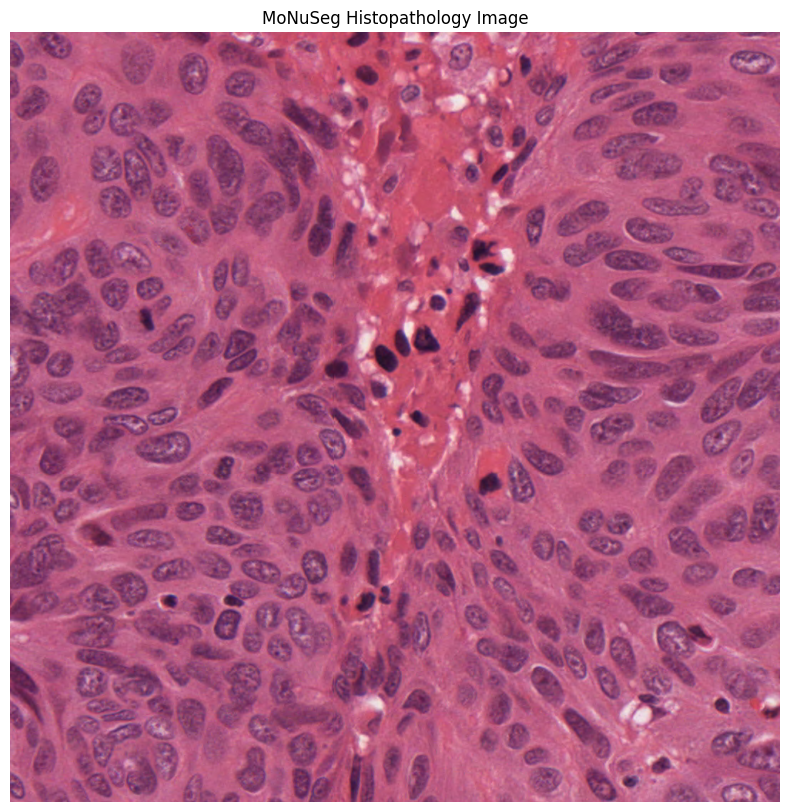

In [15]:
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
plt.axis("off")
plt.title("MoNuSeg Histopathology Image")
plt.show()

In [16]:
import xml.etree.ElementTree as ET
import numpy as np
import cv2
import matplotlib.pyplot as plt


def xml_to_mask(xml_path, image_shape):
    """
    Convert MoNuSeg XML nuclear boundary annotations
    into a binary segmentation mask.
    """

    height, width = image_shape[:2]

    mask = np.zeros((height, width), dtype=np.uint8)

    tree = ET.parse(xml_path)
    root = tree.getroot()

    for region in root.iter("Region"):
        vertices = []

        for vertex in region.iter("Vertex"):
            x = float(vertex.attrib["X"])
            y = float(vertex.attrib["Y"])

            vertices.append([int(round(x)), int(round(y))])

        if len(vertices) >= 3:
            polygon = np.array(vertices, dtype=np.int32)

            cv2.fillPoly(mask, [polygon], 1)

    return mask

In [17]:
xml_path = xml_files[0]

mask = xml_to_mask(
    xml_path,
    image.shape
)

print("Mask shape:", mask.shape)
print("Mask dtype:", mask.dtype)
print("Unique values:", np.unique(mask))

Mask shape: (1000, 1000)
Mask dtype: uint8
Unique values: [0 1]


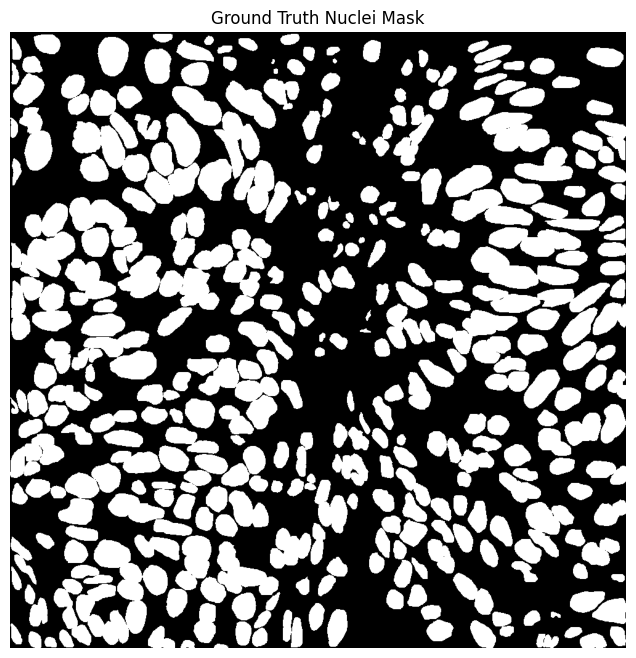

In [18]:
plt.figure(figsize=(8, 8))

plt.imshow(mask, cmap="gray")
plt.axis("off")
plt.title("Ground Truth Nuclei Mask")

plt.show()

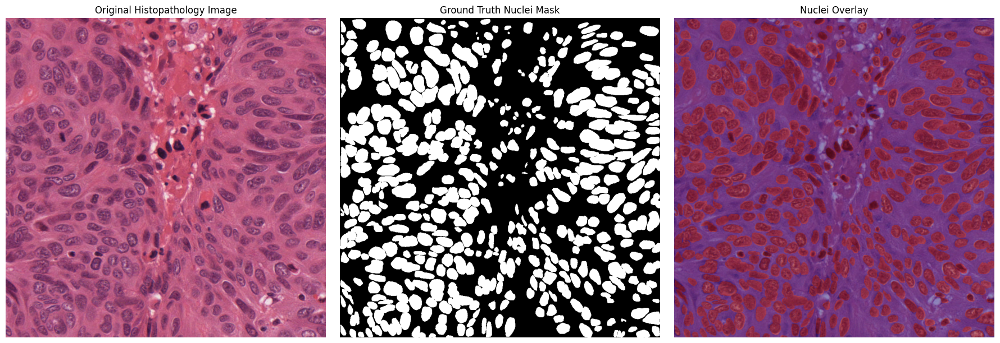

In [19]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original image
axes[0].imshow(image_rgb)
axes[0].set_title("Original Histopathology Image")
axes[0].axis("off")

# Ground truth mask
axes[1].imshow(mask, cmap="gray")
axes[1].set_title("Ground Truth Nuclei Mask")
axes[1].axis("off")

# Overlay
axes[2].imshow(image_rgb)
axes[2].imshow(mask, alpha=0.4, cmap="jet")
axes[2].set_title("Nuclei Overlay")
axes[2].axis("off")

plt.tight_layout()
plt.show()

In [20]:
import os

PATCH_IMAGE_DIR = "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/patches/images"
PATCH_MASK_DIR = "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/patches/masks"

os.makedirs(PATCH_IMAGE_DIR, exist_ok=True)
os.makedirs(PATCH_MASK_DIR, exist_ok=True)

print("Patch directories created.")

Patch directories created.


In [21]:
import os
import cv2
import numpy as np

PATCH_SIZE = 256
STRIDE = 256

image_patch_count = 0

for image_path in image_files:

    # Get corresponding XML file
    base_name = os.path.splitext(os.path.basename(image_path))[0]
    xml_path = os.path.join(
        ANNOTATION_DIR,
        base_name + ".xml"
    )

    # Read image
    img = cv2.imread(image_path)

    # Convert XML annotation to mask
    mask = xml_to_mask(xml_path, img.shape)

    h, w = img.shape[:2]

    # Generate patches
    for y in range(0, h - PATCH_SIZE + 1, STRIDE):
        for x in range(0, w - PATCH_SIZE + 1, STRIDE):

            img_patch = img[
                y:y + PATCH_SIZE,
                x:x + PATCH_SIZE
            ]

            mask_patch = mask[
                y:y + PATCH_SIZE,
                x:x + PATCH_SIZE
            ]

            # Keep patches containing nuclei
            nucleus_pixels = np.sum(mask_patch)

            if nucleus_pixels > 100:

                patch_name = f"{base_name}_{y}_{x}.png"

                cv2.imwrite(
                    os.path.join(PATCH_IMAGE_DIR, patch_name),
                    img_patch
                )

                cv2.imwrite(
                    os.path.join(PATCH_MASK_DIR, patch_name),
                    mask_patch
                )

                image_patch_count += 1

print("✅ Patch generation complete!")
print("Total patches:", image_patch_count)

✅ Patch generation complete!
Total patches: 333


In [22]:
print(
    "Image patches:",
    len(os.listdir(PATCH_IMAGE_DIR))
)

print(
    "Mask patches:",
    len(os.listdir(PATCH_MASK_DIR))
)

Image patches: 333
Mask patches: 333


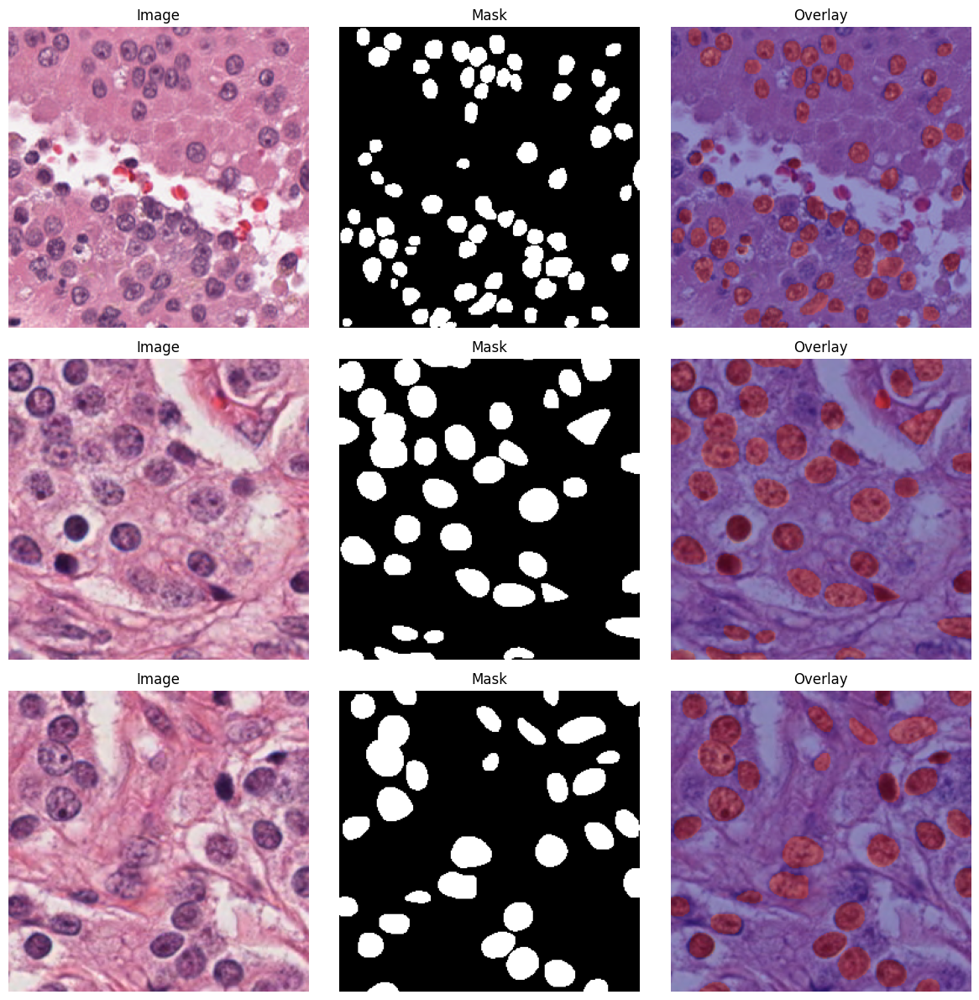

In [23]:
import random
import matplotlib.pyplot as plt
import cv2
import os

patch_names = os.listdir(PATCH_IMAGE_DIR)
sample_names = random.sample(patch_names, 3)

fig, axes = plt.subplots(3, 3, figsize=(12, 12))

for i, name in enumerate(sample_names):
    img = cv2.imread(os.path.join(PATCH_IMAGE_DIR, name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(
        os.path.join(PATCH_MASK_DIR, name),
        cv2.IMREAD_GRAYSCALE
    )

    axes[i, 0].imshow(img)
    axes[i, 0].set_title("Image")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(mask, cmap="gray")
    axes[i, 1].set_title("Mask")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(img)
    axes[i, 2].imshow(mask, alpha=0.4, cmap="jet")
    axes[i, 2].set_title("Overlay")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

In [24]:
import os
import shutil
from sklearn.model_selection import train_test_split

train_image_dir = "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/train/images"
train_mask_dir = "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/train/masks"

val_image_dir = "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/val/images"
val_mask_dir = "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/val/masks"

for directory in [train_image_dir, train_mask_dir, val_image_dir, val_mask_dir]:
    os.makedirs(directory, exist_ok=True)

image_names = os.listdir(PATCH_IMAGE_DIR)

image_ids = sorted(set(
    name.rsplit("_", 2)[0]
    for name in image_names
))

train_ids, val_ids = train_test_split(
    image_ids,
    test_size=0.2,
    random_state=42
)

print("Original images:", len(image_ids))
print("Training images:", len(train_ids))
print("Validation images:", len(val_ids))

Original images: 37
Training images: 29
Validation images: 8


In [25]:
train_count = 0
val_count = 0

for name in image_names:
    image_id = name.rsplit("_", 2)[0]

    source_image = os.path.join(PATCH_IMAGE_DIR, name)
    source_mask = os.path.join(PATCH_MASK_DIR, name)

    if image_id in train_ids:
        shutil.copy2(
            source_image,
            os.path.join(train_image_dir, name)
        )
        shutil.copy2(
            source_mask,
            os.path.join(train_mask_dir, name)
        )
        train_count += 1

    elif image_id in val_ids:
        shutil.copy2(
            source_image,
            os.path.join(val_image_dir, name)
        )
        shutil.copy2(
            source_mask,
            os.path.join(val_mask_dir, name)
        )
        val_count += 1

print("Training patches:", train_count)
print("Validation patches:", val_count)

Training patches: 261
Validation patches: 72


In [26]:
print("Training images:", len(os.listdir(train_image_dir)))
print("Training masks:", len(os.listdir(train_mask_dir)))
print("Validation images:", len(os.listdir(val_image_dir)))
print("Validation masks:", len(os.listdir(val_mask_dir)))

Training images: 261
Training masks: 261
Validation images: 72
Validation masks: 72


In [27]:
import torch
from torch.utils.data import Dataset, DataLoader
import cv2
import numpy as np
import os

In [28]:
class NucleiDataset(Dataset):

    def __init__(self, image_dir, mask_dir):
        self.image_dir = image_dir
        self.mask_dir = mask_dir

        self.image_names = sorted(os.listdir(image_dir))

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, index):

        image_name = self.image_names[index]

        image_path = os.path.join(
            self.image_dir,
            image_name
        )

        mask_path = os.path.join(
            self.mask_dir,
            image_name
        )

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(
            mask_path,
            cv2.IMREAD_GRAYSCALE
        )

        image = image.astype(np.float32) / 255.0
        mask = mask.astype(np.float32)

        image = torch.from_numpy(image)
        mask = torch.from_numpy(mask)

        image = image.permute(2, 0, 1)
        mask = mask.unsqueeze(0)

        return image, mask

In [29]:
train_dataset = NucleiDataset(
    train_image_dir,
    train_mask_dir
)

val_dataset = NucleiDataset(
    val_image_dir,
    val_mask_dir
)

print("Training samples:", len(train_dataset))
print("Validation samples:", len(val_dataset))

Training samples: 261
Validation samples: 72


In [30]:
train_loader = DataLoader(
    train_dataset,
    batch_size=8,
    shuffle=True,
    num_workers=2
)

val_loader = DataLoader(
    val_dataset,
    batch_size=8,
    shuffle=False,
    num_workers=2
)

In [31]:
images, masks = next(iter(train_loader))

print("Image batch shape:", images.shape)
print("Mask batch shape:", masks.shape)

Image batch shape: torch.Size([8, 3, 256, 256])
Mask batch shape: torch.Size([8, 1, 256, 256])


In [32]:
import torch
import torch.nn as nn


class DoubleConv(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)


class UNet(nn.Module):

    def __init__(self):
        super().__init__()

        self.encoder1 = DoubleConv(3, 64)
        self.encoder2 = DoubleConv(64, 128)
        self.encoder3 = DoubleConv(128, 256)
        self.encoder4 = DoubleConv(256, 512)

        self.pool = nn.MaxPool2d(2)

        self.bottleneck = DoubleConv(512, 1024)

        self.upconv4 = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.decoder4 = DoubleConv(1024, 512)

        self.upconv3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.decoder3 = DoubleConv(512, 256)

        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.decoder2 = DoubleConv(256, 128)

        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.decoder1 = DoubleConv(128, 64)

        self.output = nn.Conv2d(64, 1, 1)

    def forward(self, x):

        e1 = self.encoder1(x)
        e2 = self.encoder2(self.pool(e1))
        e3 = self.encoder3(self.pool(e2))
        e4 = self.encoder4(self.pool(e3))

        b = self.bottleneck(self.pool(e4))

        d4 = self.upconv4(b)
        d4 = torch.cat((d4, e4), dim=1)
        d4 = self.decoder4(d4)

        d3 = self.upconv3(d4)
        d3 = torch.cat((d3, e3), dim=1)
        d3 = self.decoder3(d3)

        d2 = self.upconv2(d3)
        d2 = torch.cat((d2, e2), dim=1)
        d2 = self.decoder2(d2)

        d1 = self.upconv1(d2)
        d1 = torch.cat((d1, e1), dim=1)
        d1 = self.decoder1(d1)

        return self.output(d1)

In [33]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UNet().to(device)

print("Device:", device)
print("Model created")

Device: cuda
Model created


In [34]:
images, masks = next(iter(train_loader))

images = images.to(device)
masks = masks.to(device)

with torch.no_grad():
    outputs = model(images)

print("Input shape:", images.shape)
print("Output shape:", outputs.shape)
print("Mask shape:", masks.shape)

Input shape: torch.Size([8, 3, 256, 256])
Output shape: torch.Size([8, 1, 256, 256])
Mask shape: torch.Size([8, 1, 256, 256])


In [35]:
import torch
import torch.nn as nn

bce_loss = nn.BCEWithLogitsLoss()


def dice_loss(pred, target):
    pred = torch.sigmoid(pred)

    pred = pred.view(-1)
    target = target.view(-1)

    intersection = (pred * target).sum()

    dice = (2 * intersection + 1e-7) / (
        pred.sum() + target.sum() + 1e-7
    )

    return 1 - dice


def combined_loss(pred, target):
    bce = bce_loss(pred, target)
    dice = dice_loss(pred, target)

    return bce + dice

In [36]:
optimizer = torch.optim.Adam(
    model.parameters(),
    lr=1e-4
)

print("Loss function and optimizer are ready.")

Loss function and optimizer are ready.


In [37]:
def dice_score(pred, target):
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()

    intersection = (pred * target).sum()

    dice = (2 * intersection + 1e-7) / (
        pred.sum() + target.sum() + 1e-7
    )

    return dice.item()


def iou_score(pred, target):
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()

    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection

    iou = (intersection + 1e-7) / (union + 1e-7)

    return iou.item()

In [38]:
num_epochs = 20

train_losses = []
val_losses = []
val_dice_scores = []
val_iou_scores = []

best_val_dice = 0.0

for epoch in range(num_epochs):

    model.train()

    running_train_loss = 0.0

    for images, masks in train_loader:

        images = images.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = combined_loss(outputs, masks)

        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()

    train_loss = running_train_loss / len(train_loader)

    model.eval()

    running_val_loss = 0.0
    running_dice = 0.0
    running_iou = 0.0

    with torch.no_grad():

        for images, masks in val_loader:

            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)

            loss = combined_loss(outputs, masks)

            running_val_loss += loss.item()
            running_dice += dice_score(outputs, masks)
            running_iou += iou_score(outputs, masks)

    val_loss = running_val_loss / len(val_loader)
    val_dice = running_dice / len(val_loader)
    val_iou = running_iou / len(val_loader)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_dice_scores.append(val_dice)
    val_iou_scores.append(val_iou)

    if val_dice > best_val_dice:
        best_val_dice = val_dice

        torch.save(
            model.state_dict(),
            "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/best_unet.pth"
        )

    print(
        f"Epoch {epoch + 1}/{num_epochs} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Val Loss: {val_loss:.4f} | "
        f"Dice: {val_dice:.4f} | "
        f"IoU: {val_iou:.4f}"
    )

Epoch 1/20 | Train Loss: 0.9026 | Val Loss: 1.0564 | Dice: 0.3938 | IoU: 0.2716
Epoch 2/20 | Train Loss: 0.7345 | Val Loss: 0.7669 | Dice: 0.7323 | IoU: 0.5840
Epoch 3/20 | Train Loss: 0.6791 | Val Loss: 0.7175 | Dice: 0.7544 | IoU: 0.6105
Epoch 4/20 | Train Loss: 0.6470 | Val Loss: 0.7042 | Dice: 0.7637 | IoU: 0.6213
Epoch 5/20 | Train Loss: 0.6119 | Val Loss: 0.6874 | Dice: 0.7613 | IoU: 0.6186
Epoch 6/20 | Train Loss: 0.5891 | Val Loss: 0.6084 | Dice: 0.7977 | IoU: 0.6645
Epoch 7/20 | Train Loss: 0.5675 | Val Loss: 0.6353 | Dice: 0.7750 | IoU: 0.6367
Epoch 8/20 | Train Loss: 0.5538 | Val Loss: 0.6134 | Dice: 0.7878 | IoU: 0.6517
Epoch 9/20 | Train Loss: 0.5280 | Val Loss: 0.5722 | Dice: 0.7975 | IoU: 0.6652
Epoch 10/20 | Train Loss: 0.5268 | Val Loss: 0.6358 | Dice: 0.7730 | IoU: 0.6324
Epoch 11/20 | Train Loss: 0.5097 | Val Loss: 0.5423 | Dice: 0.8075 | IoU: 0.6784
Epoch 12/20 | Train Loss: 0.5006 | Val Loss: 0.5669 | Dice: 0.7877 | IoU: 0.6552
Epoch 13/20 | Train Loss: 0.4843 | Va

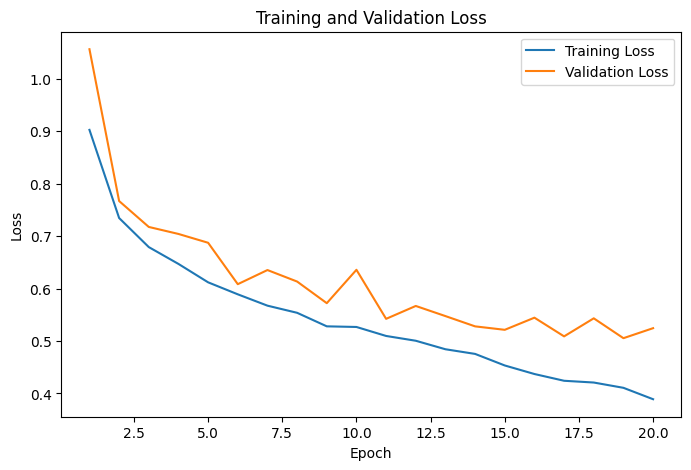

In [39]:
import matplotlib.pyplot as plt

epochs = range(1, len(train_losses) + 1)

plt.figure(figsize=(8, 5))
plt.plot(epochs, train_losses, label="Training Loss")
plt.plot(epochs, val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.show()

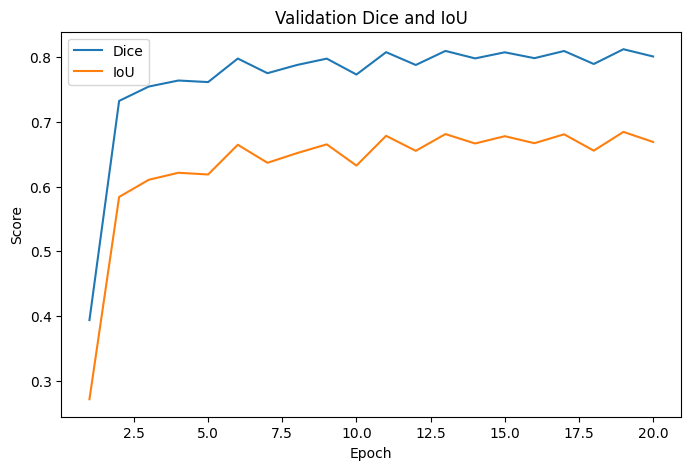

In [40]:
plt.figure(figsize=(8, 5))
plt.plot(epochs, val_dice_scores, label="Dice")
plt.plot(epochs, val_iou_scores, label="IoU")
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Validation Dice and IoU")
plt.legend()
plt.show()

In [41]:
model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/best_unet.pth",
        map_location=device
    )
)

model.eval()

UNet(
  (encoder1): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (encoder2): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (encoder3): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(128, 256, 

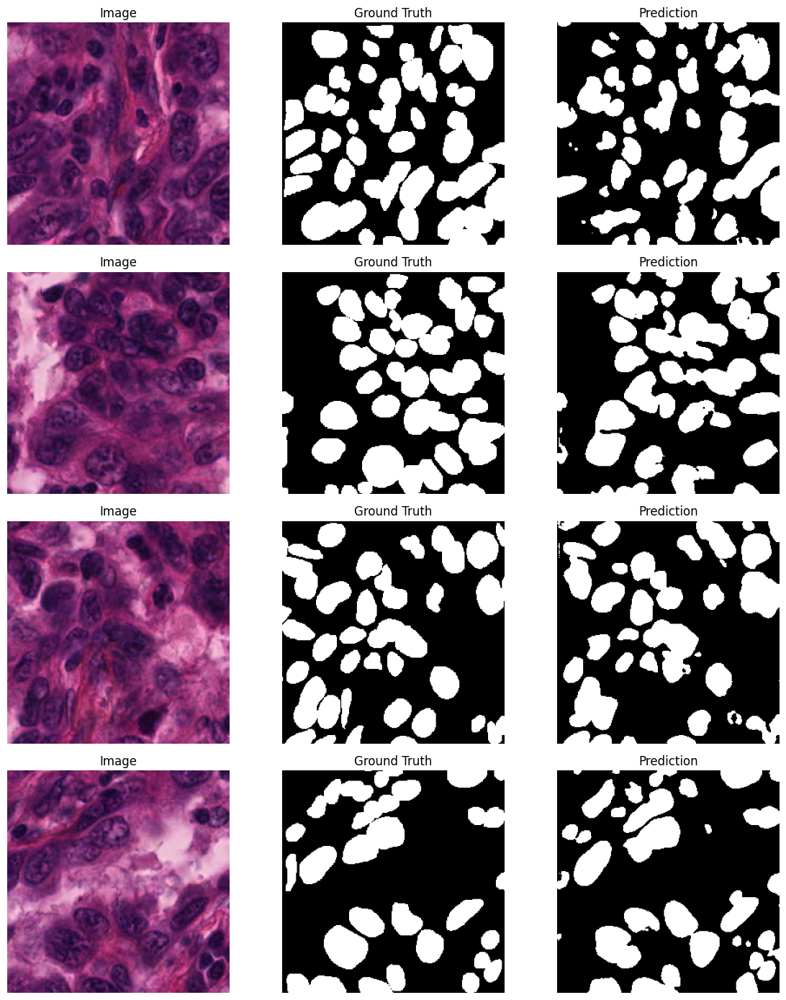

In [42]:
images, masks = next(iter(val_loader))

images = images.to(device)
masks = masks.to(device)

with torch.no_grad():
    predictions = model(images)

predictions = torch.sigmoid(predictions)
predictions = (predictions > 0.5).float()

fig, axes = plt.subplots(4, 3, figsize=(12, 14))

for i in range(4):

    image = images[i].cpu().permute(1, 2, 0).numpy()
    mask = masks[i].cpu().squeeze().numpy()
    prediction = predictions[i].cpu().squeeze().numpy()

    axes[i, 0].imshow(image)
    axes[i, 0].set_title("Image")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(mask, cmap="gray")
    axes[i, 1].set_title("Ground Truth")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(prediction, cmap="gray")
    axes[i, 2].set_title("Prediction")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

In [43]:
import os

model_path = "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/best_unet.pth"

print("Model exists:", os.path.exists(model_path))

if os.path.exists(model_path):
    print("Model size:", os.path.getsize(model_path) / (1024 ** 2), "MB")

Model exists: True
Model size: 118.51056957244873 MB


In [44]:
!pip install -q albumentations

In [45]:
import albumentations as A

In [46]:
train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.RandomBrightnessContrast(
        brightness_limit=0.15,
        contrast_limit=0.15,
        p=0.5
    )
])

In [47]:
class NucleiDataset(Dataset):

    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.image_names = sorted(os.listdir(image_dir))

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, index):

        image_name = self.image_names[index]

        image_path = os.path.join(
            self.image_dir,
            image_name
        )

        mask_path = os.path.join(
            self.mask_dir,
            image_name
        )

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(
            mask_path,
            cv2.IMREAD_GRAYSCALE
        )

        if self.transform:
            augmented = self.transform(
                image=image,
                mask=mask
            )

            image = augmented["image"]
            mask = augmented["mask"]

        image = image.astype(np.float32) / 255.0
        mask = mask.astype(np.float32)

        image = torch.from_numpy(image)
        mask = torch.from_numpy(mask)

        image = image.permute(2, 0, 1)
        mask = mask.unsqueeze(0)

        return image, mask

In [48]:
train_dataset = NucleiDataset(
    train_image_dir,
    train_mask_dir,
    transform=train_transform
)

val_dataset = NucleiDataset(
    val_image_dir,
    val_mask_dir
)

In [49]:
train_loader = DataLoader(
    train_dataset,
    batch_size=8,
    shuffle=True,
    num_workers=2
)

val_loader = DataLoader(
    val_dataset,
    batch_size=8,
    shuffle=False,
    num_workers=2
)

print("Training samples:", len(train_dataset))
print("Validation samples:", len(val_dataset))

Training samples: 261
Validation samples: 72


In [50]:
model = UNet().to(device)

model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/best_unet.pth",
        map_location=device
    )
)

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=5e-5
)

print("Baseline model loaded.")

Baseline model loaded.


In [51]:
num_epochs = 15

aug_train_losses = []
aug_val_losses = []
aug_val_dice_scores = []
aug_val_iou_scores = []

best_aug_dice = 0.0

for epoch in range(num_epochs):

    model.train()
    running_train_loss = 0.0

    for images, masks in train_loader:

        images = images.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = combined_loss(outputs, masks)

        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()

    train_loss = running_train_loss / len(train_loader)

    model.eval()

    running_val_loss = 0.0
    running_dice = 0.0
    running_iou = 0.0

    with torch.no_grad():

        for images, masks in val_loader:

            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)

            loss = combined_loss(outputs, masks)

            running_val_loss += loss.item()
            running_dice += dice_score(outputs, masks)
            running_iou += iou_score(outputs, masks)

    val_loss = running_val_loss / len(val_loader)
    val_dice = running_dice / len(val_loader)
    val_iou = running_iou / len(val_loader)

    aug_train_losses.append(train_loss)
    aug_val_losses.append(val_loss)
    aug_val_dice_scores.append(val_dice)
    aug_val_iou_scores.append(val_iou)

    if val_dice > best_aug_dice:
        best_aug_dice = val_dice

        torch.save(
            model.state_dict(),
            "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/best_augmented_unet.pth"
        )

    print(
        f"Epoch {epoch + 1}/{num_epochs} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Val Loss: {val_loss:.4f} | "
        f"Dice: {val_dice:.4f} | "
        f"IoU: {val_iou:.4f}"
    )

Epoch 1/15 | Train Loss: 0.4846 | Val Loss: 0.4725 | Dice: 0.8263 | IoU: 0.7045
Epoch 2/15 | Train Loss: 0.4668 | Val Loss: 0.4788 | Dice: 0.8235 | IoU: 0.7004
Epoch 3/15 | Train Loss: 0.4453 | Val Loss: 0.4816 | Dice: 0.8162 | IoU: 0.6906
Epoch 4/15 | Train Loss: 0.4546 | Val Loss: 0.4589 | Dice: 0.8253 | IoU: 0.7033
Epoch 5/15 | Train Loss: 0.4538 | Val Loss: 0.5253 | Dice: 0.8095 | IoU: 0.6811
Epoch 6/15 | Train Loss: 0.4533 | Val Loss: 0.4558 | Dice: 0.8253 | IoU: 0.7030
Epoch 7/15 | Train Loss: 0.4468 | Val Loss: 0.4608 | Dice: 0.8280 | IoU: 0.7069
Epoch 8/15 | Train Loss: 0.4441 | Val Loss: 0.4815 | Dice: 0.8227 | IoU: 0.6993
Epoch 9/15 | Train Loss: 0.4416 | Val Loss: 0.4545 | Dice: 0.8272 | IoU: 0.7058
Epoch 10/15 | Train Loss: 0.4314 | Val Loss: 0.4454 | Dice: 0.8308 | IoU: 0.7111
Epoch 11/15 | Train Loss: 0.4285 | Val Loss: 0.4630 | Dice: 0.8224 | IoU: 0.6989
Epoch 12/15 | Train Loss: 0.4295 | Val Loss: 0.4511 | Dice: 0.8270 | IoU: 0.7053
Epoch 13/15 | Train Loss: 0.4258 | Va

In [52]:
best_model_path = "/content/drive/MyDrive/Histopathology_Project (1)/MoNuSeg/best_augmented_unet.pth"

model.load_state_dict(
    torch.load(
        best_model_path,
        map_location=device
    )
)

model.eval()

print("Best augmented model loaded.")

Best augmented model loaded.


In [53]:
val_dice = []
val_iou = []

with torch.no_grad():

    for images, masks in val_loader:

        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)

        val_dice.append(dice_score(outputs, masks))
        val_iou.append(iou_score(outputs, masks))

print("Mean Validation Dice:", np.mean(val_dice))
print("Mean Validation IoU:", np.mean(val_iou))

Mean Validation Dice: 0.8307889103889465
Mean Validation IoU: 0.7110808425479465


In [54]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from scipy import ndimage

In [55]:
images, masks = next(iter(val_loader))

image = images[0:1].to(device)

with torch.no_grad():
    output = model(image)

probability = torch.sigmoid(output)[0, 0].cpu().numpy()

binary_mask = (probability > 0.5).astype(np.uint8)

print("Predicted nuclei pixels:", binary_mask.sum())

Predicted nuclei pixels: 21829


In [56]:
distance = cv2.distanceTransform(
    binary_mask,
    cv2.DIST_L2,
    5
)

print("Maximum distance:", distance.max())

Maximum distance: 22.1969


In [57]:
coordinates = peak_local_max(
    distance,
    min_distance=8,
    threshold_abs=2
)

markers = np.zeros(distance.shape, dtype=np.int32)

for i, (y, x) in enumerate(coordinates, start=1):
    markers[y, x] = i

markers = ndimage.label(markers)[0]

print("Detected nucleus centers:", len(coordinates))

Detected nucleus centers: 39


In [58]:
labels = watershed(
    -distance,
    markers,
    mask=binary_mask
)

print("Individual nuclei detected:", labels.max())

Individual nuclei detected: 39


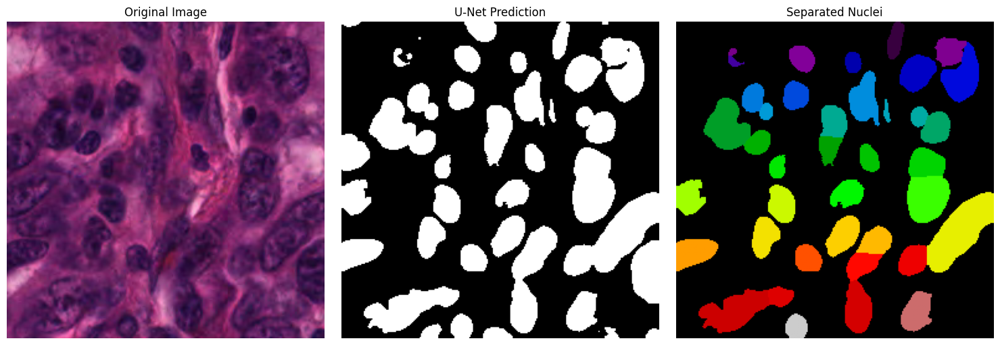

In [59]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image[0].cpu().permute(1, 2, 0).numpy())
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(binary_mask, cmap="gray")
plt.title("U-Net Prediction")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(labels, cmap="nipy_spectral")
plt.title("Separated Nuclei")
plt.axis("off")

plt.tight_layout()
plt.show()

In [60]:
from skimage.measure import regionprops
import pandas as pd
import numpy as np

regions = regionprops(labels)

nuclei_data = []

for i, region in enumerate(regions, start=1):

    area = region.area
    perimeter = region.perimeter

    if perimeter > 0:
        circularity = (4 * np.pi * area) / (perimeter ** 2)
    else:
        circularity = 0

    nuclei_data.append({
        "nucleus_id": i,
        "area": area,
        "perimeter": perimeter,
        "centroid_y": region.centroid[0],
        "centroid_x": region.centroid[1],
        "width": region.bbox[3] - region.bbox[1],
        "height": region.bbox[2] - region.bbox[0],
        "circularity": circularity
    })

nuclei_df = pd.DataFrame(nuclei_data)

print("Number of nuclei:", len(nuclei_df))
print()
print(nuclei_df.head())

Number of nuclei: 39

   nucleus_id   area  perimeter  centroid_y  centroid_x  width  height  \
0           1  301.0  74.870058   15.033223  176.225914     14      31   
1           2   33.0  19.071068   24.515152   44.969697      7       6   
2           3  439.0  85.355339   23.922551  220.036446     26      24   
3           4  350.0  67.941125   29.828571  101.028571     21      22   
4           5   60.0  32.142136   32.633333   46.166667     13       9   

   circularity  
0     0.674777  
1     1.140181  
2     0.757204  
3     0.952823  
4     0.729813  


In [61]:
summary = {
    "nuclei_count": len(nuclei_df),
    "total_nuclear_area": nuclei_df["area"].sum(),
    "mean_nuclear_area": nuclei_df["area"].mean(),
    "median_nuclear_area": nuclei_df["area"].median(),
    "mean_perimeter": nuclei_df["perimeter"].mean(),
    "mean_circularity": nuclei_df["circularity"].mean(),
    "nuclear_area_percentage": (
        nuclei_df["area"].sum() /
        binary_mask.size
    ) * 100
}

for key, value in summary.items():
    print(f"{key}: {value:.2f}")

nuclei_count: 39.00
total_nuclear_area: 19444.00
mean_nuclear_area: 498.56
median_nuclear_area: 458.00
mean_perimeter: 85.05
mean_circularity: 0.81
nuclear_area_percentage: 29.67


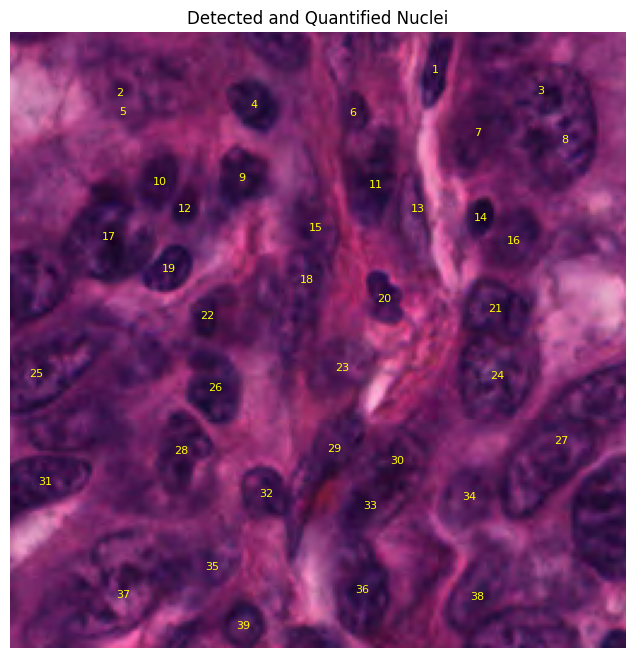

In [62]:
plt.figure(figsize=(8, 8))

plt.imshow(
    image[0].cpu().permute(1, 2, 0).numpy()
)

for i, region in enumerate(regions, start=1):

    y, x = region.centroid

    plt.text(
        x,
        y,
        str(i),
        fontsize=8,
        color="yellow",
        ha="center",
        va="center"
    )

plt.axis("off")
plt.title("Detected and Quantified Nuclei")
plt.show()

In [63]:
from sklearn.metrics import confusion_matrix
import numpy as np

model.eval()

all_dice = []
all_iou = []
all_precision = []
all_recall = []

with torch.no_grad():

    for images, masks in val_loader:

        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)
        probabilities = torch.sigmoid(outputs)

        predictions = (probabilities > 0.5).float()

        for pred, target in zip(predictions, masks):

            pred = pred.squeeze().cpu().numpy().astype(np.uint8)
            target = target.squeeze().cpu().numpy().astype(np.uint8)

            intersection = np.logical_and(pred, target).sum()
            union = np.logical_or(pred, target).sum()

            dice = (2 * intersection) / (
                pred.sum() + target.sum() + 1e-7
            )

            iou = intersection / (union + 1e-7)

            true_positive = np.logical_and(
                pred == 1,
                target == 1
            ).sum()

            false_positive = np.logical_and(
                pred == 1,
                target == 0
            ).sum()

            false_negative = np.logical_and(
                pred == 0,
                target == 1
            ).sum()

            precision = true_positive / (
                true_positive + false_positive + 1e-7
            )

            recall = true_positive / (
                true_positive + false_negative + 1e-7
            )

            all_dice.append(dice)
            all_iou.append(iou)
            all_precision.append(precision)
            all_recall.append(recall)

print("Validation Results")
print("------------------")
print("Dice:", np.mean(all_dice))
print("IoU:", np.mean(all_iou))
print("Precision:", np.mean(all_precision))
print("Recall:", np.mean(all_recall))

Validation Results
------------------
Dice: 0.8288965832688228
IoU: 0.7093899619265152
Precision: 0.8354270958037192
Recall: 0.8326603226718446


In [64]:
from skimage.morphology import remove_small_objects
from skimage.measure import regionprops
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from scipy import ndimage
import pandas as pd
import cv2
import numpy as np
import os

results = []

model.eval()

with torch.no_grad():

    for images, masks in val_loader:

        images = images.to(device)

        outputs = model(images)
        probabilities = torch.sigmoid(outputs)

        predictions = (probabilities > 0.5).float()

        for i in range(len(images)):

            binary_mask = predictions[i, 0].cpu().numpy().astype(bool)

            binary_mask = remove_small_objects(
                binary_mask,
                min_size=50
            )

            distance = cv2.distanceTransform(
                binary_mask.astype(np.uint8),
                cv2.DIST_L2,
                5
            )

            coordinates = peak_local_max(
                distance,
                min_distance=8,
                threshold_abs=2
            )

            markers = np.zeros(
                distance.shape,
                dtype=np.int32
            )

            for marker_id, (y, x) in enumerate(
                coordinates,
                start=1
            ):
                markers[y, x] = marker_id

            markers = ndimage.label(markers)[0]

            labels = watershed(
                -distance,
                markers,
                mask=binary_mask
            )

            regions = regionprops(labels)

            valid_regions = [
                region for region in regions
                if region.area >= 50
            ]

            areas = [region.area for region in valid_regions]

            perimeters = [
                region.perimeter
                for region in valid_regions
            ]

            circularities = []

            for area, perimeter in zip(
                areas,
                perimeters
            ):
                if perimeter > 0:
                    circularity = (
                        4 * np.pi * area
                    ) / (perimeter ** 2)
                else:
                    circularity = 0

                circularities.append(circularity)

            image_name = val_dataset.image_names[
                i
            ]

            results.append({
                "patch": image_name,
                "nuclei_count": len(valid_regions),
                "mean_area": np.mean(areas) if areas else 0,
                "median_area": np.median(areas) if areas else 0,
                "mean_perimeter": (
                    np.mean(perimeters)
                    if perimeters else 0
                ),
                "mean_circularity": (
                    np.mean(circularities)
                    if circularities else 0
                ),
                "total_nuclear_area": np.sum(areas)
            })

results_df = pd.DataFrame(results)

print("Number of validation patches:", len(results_df))
print()
print(results_df.head())

Number of validation patches: 72

                                 patch  nuclei_count   mean_area  median_area  \
0      TCGA-49-4488-01Z-00-DX1_0_0.png            38  510.815789        460.5   
1    TCGA-49-4488-01Z-00-DX1_0_256.png            30  646.133333        594.0   
2    TCGA-49-4488-01Z-00-DX1_0_512.png            26  654.346154        573.5   
3    TCGA-49-4488-01Z-00-DX1_256_0.png            24  634.083333        469.5   
4  TCGA-49-4488-01Z-00-DX1_256_256.png            35  560.542857        451.0   

   mean_perimeter  mean_circularity  total_nuclear_area  
0       86.783419          0.804649             19411.0  
1       98.357574          0.814440             19384.0  
2      101.697279          0.753840             17013.0  
3       96.550942          0.814655             15218.0  
4       87.832439          0.856100             19619.0  


In [65]:
print("Overall Quantification")
print("----------------------")

print(
    "Average nuclei per patch:",
    results_df["nuclei_count"].mean()
)

print(
    "Average nuclear area:",
    results_df["mean_area"].mean()
)

print(
    "Average perimeter:",
    results_df["mean_perimeter"].mean()
)

print(
    "Average circularity:",
    results_df["mean_circularity"].mean()
)

print(
    "Total detected nuclei:",
    results_df["nuclei_count"].sum()
)

Overall Quantification
----------------------
Average nuclei per patch: 36.09722222222222
Average nuclear area: 502.64979854514434
Average perimeter: 83.18493645339072
Average circularity: 0.8410481531415344
Total detected nuclei: 2599


In [66]:
results_path = "/content/nuclei_quantification.csv"

results_df.to_csv(
    results_path,
    index=False
)

print("Saved:", results_path)

Saved: /content/nuclei_quantification.csv


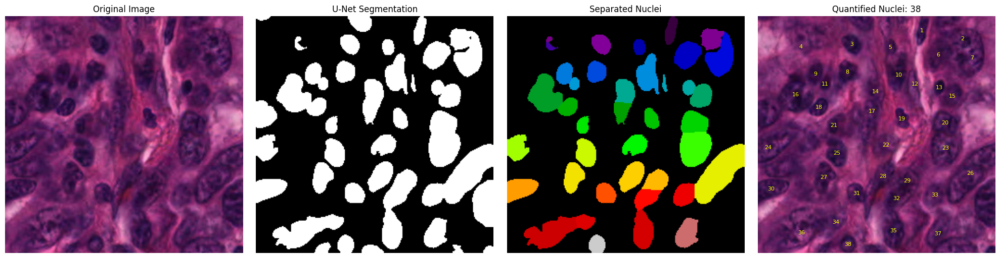

In [67]:
import matplotlib.pyplot as plt

sample_name = results_df.iloc[0]["patch"]

image_path = os.path.join(val_image_dir, sample_name)

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

image_tensor = torch.from_numpy(
    image.astype(np.float32) / 255.0
).permute(2, 0, 1).unsqueeze(0).to(device)

with torch.no_grad():
    output = model(image_tensor)

probability = torch.sigmoid(output)[0, 0].cpu().numpy()

binary_mask = (probability > 0.5).astype(np.uint8)

binary_mask = remove_small_objects(
    binary_mask.astype(bool),
    min_size=50
)

distance = cv2.distanceTransform(
    binary_mask.astype(np.uint8),
    cv2.DIST_L2,
    5
)

coordinates = peak_local_max(
    distance,
    min_distance=8,
    threshold_abs=2
)

markers = np.zeros(
    distance.shape,
    dtype=np.int32
)

for marker_id, (y, x) in enumerate(
    coordinates,
    start=1
):
    markers[y, x] = marker_id

markers = ndimage.label(markers)[0]

labels = watershed(
    -distance,
    markers,
    mask=binary_mask
)

regions = [
    region for region in regionprops(labels)
    if region.area >= 50
]

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(binary_mask, cmap="gray")
axes[1].set_title("U-Net Segmentation")
axes[1].axis("off")

axes[2].imshow(labels, cmap="nipy_spectral")
axes[2].set_title("Separated Nuclei")
axes[2].axis("off")

axes[3].imshow(image)

for i, region in enumerate(regions, start=1):
    y, x = region.centroid

    axes[3].text(
        x,
        y,
        str(i),
        fontsize=8,
        color="yellow",
        ha="center",
        va="center"
    )

axes[3].set_title(
    f"Quantified Nuclei: {len(regions)}"
)
axes[3].axis("off")

plt.tight_layout()
plt.show()

In [68]:
def analyze_nuclei(image_path):

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    image_tensor = torch.from_numpy(
        image.astype(np.float32) / 255.0
    )

    image_tensor = image_tensor.permute(2, 0, 1)
    image_tensor = image_tensor.unsqueeze(0).to(device)

    model.eval()

    with torch.no_grad():
        output = model(image_tensor)

    probability = torch.sigmoid(output)[0, 0].cpu().numpy()

    binary_mask = (probability > 0.5)

    binary_mask = remove_small_objects(
        binary_mask,
        min_size=50
    )

    distance = cv2.distanceTransform(
        binary_mask.astype(np.uint8),
        cv2.DIST_L2,
        5
    )

    coordinates = peak_local_max(
        distance,
        min_distance=8,
        threshold_abs=2
    )

    markers = np.zeros(
        distance.shape,
        dtype=np.int32
    )

    for marker_id, (y, x) in enumerate(
        coordinates,
        start=1
    ):
        markers[y, x] = marker_id

    markers = ndimage.label(markers)[0]

    labels = watershed(
        -distance,
        markers,
        mask=binary_mask
    )

    regions = [
        region for region in regionprops(labels)
        if region.area >= 50
    ]

    measurements = []

    for i, region in enumerate(regions, start=1):

        area = region.area
        perimeter = region.perimeter

        if perimeter > 0:
            circularity = (
                4 * np.pi * area
            ) / (perimeter ** 2)
        else:
            circularity = 0

        measurements.append({
            "nucleus_id": i,
            "area": area,
            "perimeter": perimeter,
            "centroid_y": region.centroid[0],
            "centroid_x": region.centroid[1],
            "width": region.bbox[3] - region.bbox[1],
            "height": region.bbox[2] - region.bbox[0],
            "circularity": circularity
        })

    measurements_df = pd.DataFrame(measurements)

    return image, binary_mask, labels, measurements_df

In [69]:
sample_path = os.path.join(
    val_image_dir,
    results_df.iloc[0]["patch"]
)

image, binary_mask, labels, measurements_df = analyze_nuclei(
    sample_path
)

print("Nuclei detected:", len(measurements_df))
print()
print(measurements_df.head())

Nuclei detected: 38

   nucleus_id   area  perimeter  centroid_y  centroid_x  width  height  \
0           1  301.0  74.870058   15.033223  176.225914     14      31   
1           2  439.0  85.355339   23.922551  220.036446     26      24   
2           3  350.0  67.941125   29.828571  101.028571     21      22   
3           4   60.0  32.142136   32.633333   46.166667     13       9   
4           5  190.0  49.798990   33.026316  142.110526     14      17   

   circularity  
0     0.674777  
1     0.757204  
2     0.952823  
3     0.729813  
4     0.962770  


In [70]:
print("Nuclei count:", len(measurements_df))
print("Mean area:", measurements_df["area"].mean())
print("Median area:", measurements_df["area"].median())
print("Mean perimeter:", measurements_df["perimeter"].mean())
print("Mean circularity:", measurements_df["circularity"].mean())
print("Total nuclear area:", measurements_df["area"].sum())

Nuclei count: 38
Mean area: 510.8157894736842
Median area: 460.5
Mean perimeter: 86.78341872524209
Mean circularity: 0.8046494755728861
Total nuclear area: 19411.0


In [71]:
results_df.to_csv(
    "/content/nuclei_quantification.csv",
    index=False
)

print(results_df.shape)
print(results_df.columns.tolist())

(72, 7)
['patch', 'nuclei_count', 'mean_area', 'median_area', 'mean_perimeter', 'mean_circularity', 'total_nuclear_area']


In [72]:
final_summary = pd.DataFrame({
    "Metric": [
        "Validation patches",
        "Total detected nuclei",
        "Average nuclei per patch",
        "Average nuclear area",
        "Average perimeter",
        "Average circularity",
        "Dice",
        "IoU",
        "Precision",
        "Recall"
    ],
    "Value": [
        len(results_df),
        results_df["nuclei_count"].sum(),
        results_df["nuclei_count"].mean(),
        results_df["mean_area"].mean(),
        results_df["mean_perimeter"].mean(),
        results_df["mean_circularity"].mean(),
        np.mean(all_dice),
        np.mean(all_iou),
        np.mean(all_precision),
        np.mean(all_recall)
    ]
})

print(final_summary.to_string(index=False))

                  Metric       Value
      Validation patches   72.000000
   Total detected nuclei 2599.000000
Average nuclei per patch   36.097222
    Average nuclear area  502.649799
       Average perimeter   83.184936
     Average circularity    0.841048
                    Dice    0.828897
                     IoU    0.709390
               Precision    0.835427
                  Recall    0.832660


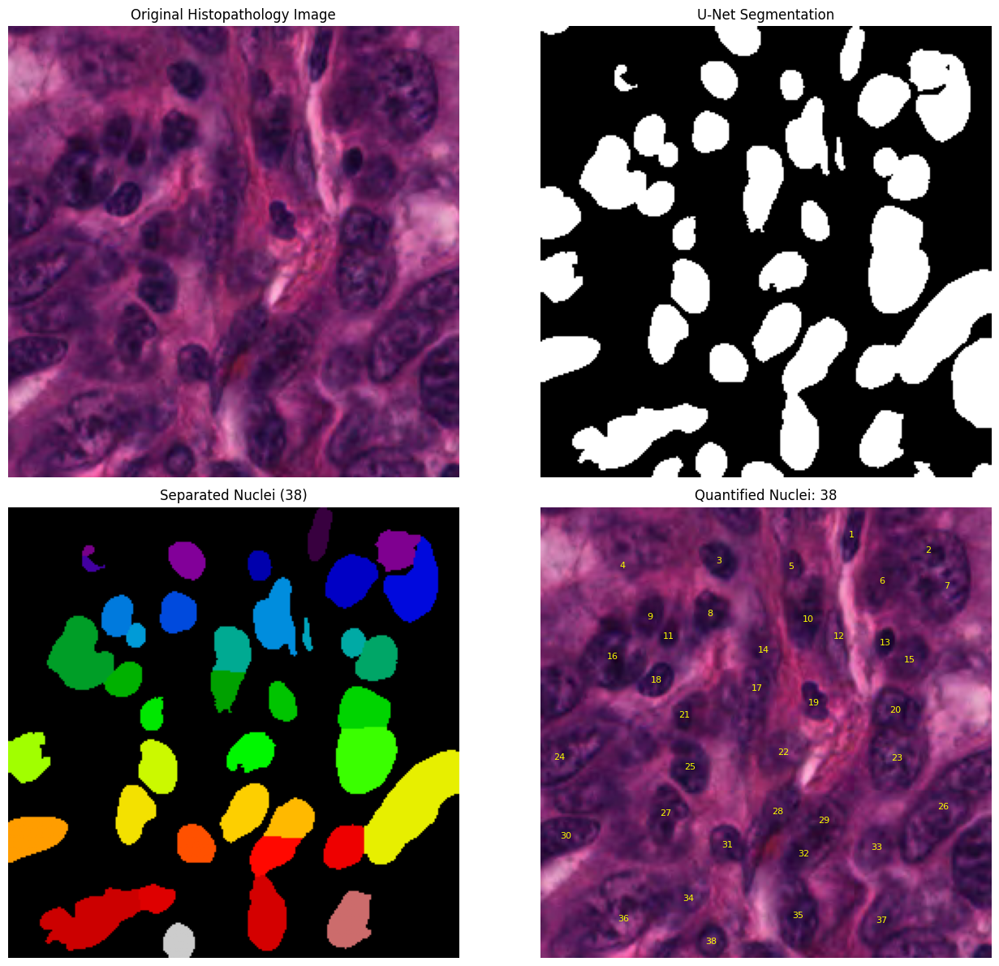

In [73]:
import matplotlib.pyplot as plt

sample_name = results_df.iloc[0]["patch"]

image, binary_mask, labels, measurements_df = analyze_nuclei(
    os.path.join(val_image_dir, sample_name)
)

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

axes[0, 0].imshow(image)
axes[0, 0].set_title("Original Histopathology Image")
axes[0, 0].axis("off")

axes[0, 1].imshow(binary_mask, cmap="gray")
axes[0, 1].set_title("U-Net Segmentation")
axes[0, 1].axis("off")

axes[1, 0].imshow(labels, cmap="nipy_spectral")
axes[1, 0].set_title(
    f"Separated Nuclei ({len(measurements_df)})"
)
axes[1, 0].axis("off")

axes[1, 1].imshow(image)

for _, row in measurements_df.iterrows():
    axes[1, 1].text(
        row["centroid_x"],
        row["centroid_y"],
        str(int(row["nucleus_id"])),
        fontsize=8,
        color="yellow",
        ha="center",
        va="center"
    )

axes[1, 1].set_title(
    f"Quantified Nuclei: {len(measurements_df)}"
)
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()

In [74]:

print([
    name for name in globals()
    if "loss" in name.lower()
    or "dice" in name.lower()
    or "iou" in name.lower()
    or "history" in name.lower()
])

['bce_loss', 'dice_loss', 'combined_loss', 'dice_score', 'iou_score', 'train_losses', 'val_losses', 'val_dice_scores', 'val_iou_scores', 'best_val_dice', 'running_train_loss', 'loss', 'train_loss', 'running_val_loss', 'running_dice', 'running_iou', 'val_loss', 'val_dice', 'val_iou', 'aug_train_losses', 'aug_val_losses', 'aug_val_dice_scores', 'aug_val_iou_scores', 'best_aug_dice', 'all_dice', 'all_iou', 'dice', 'iou']


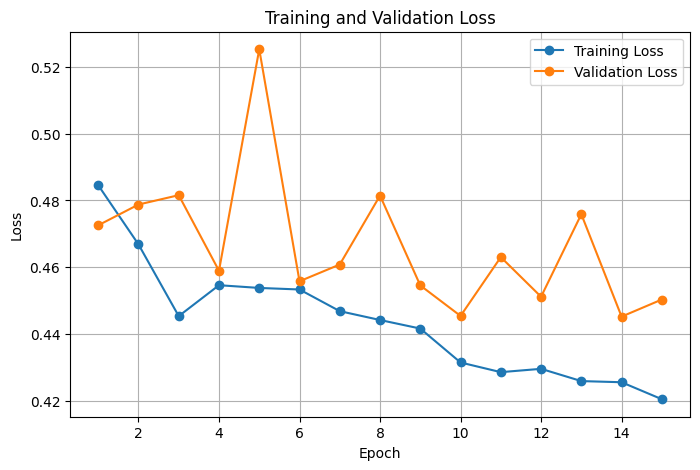

In [75]:
import matplotlib.pyplot as plt

epochs = range(1, len(aug_train_losses) + 1)

plt.figure(figsize=(8, 5))

plt.plot(
    epochs,
    aug_train_losses,
    marker="o",
    label="Training Loss"
)

plt.plot(
    epochs,
    aug_val_losses,
    marker="o",
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

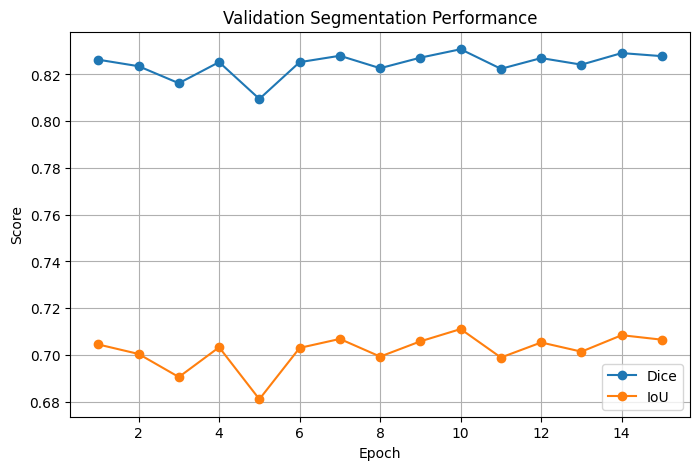

In [76]:
plt.figure(figsize=(8, 5))

plt.plot(
    epochs,
    aug_val_dice_scores,
    marker="o",
    label="Dice"
)

plt.plot(
    epochs,
    aug_val_iou_scores,
    marker="o",
    label="IoU"
)

plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Validation Segmentation Performance")
plt.legend()
plt.grid(True)
plt.show()

In [77]:
import torch
import os

model_path = "/content/histopathology_unet_final.pth"

torch.save(
    model.state_dict(),
    model_path
)

print("Model saved successfully")
print("Path:", model_path)
print("Size:", os.path.getsize(model_path) / (1024 * 1024), "MB")

Model saved successfully
Path: /content/histopathology_unet_final.pth
Size: 118.51279735565186 MB


In [78]:
checkpoint = torch.load(
    model_path,
    map_location=device
)

model.load_state_dict(checkpoint)

model.eval()

print("Model loaded successfully")

Model loaded successfully


In [79]:
model.eval()

total_correct = 0
total_pixels = 0

all_f1 = []
all_specificity = []

with torch.no_grad():

    for images, masks in val_loader:

        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)
        probabilities = torch.sigmoid(outputs)

        predictions = (probabilities > 0.5).float()

        for pred, target in zip(predictions, masks):

            pred = pred.squeeze().cpu().numpy().astype(np.uint8)
            target = target.squeeze().cpu().numpy().astype(np.uint8)

            tp = np.logical_and(
                pred == 1,
                target == 1
            ).sum()

            tn = np.logical_and(
                pred == 0,
                target == 0
            ).sum()

            fp = np.logical_and(
                pred == 1,
                target == 0
            ).sum()

            fn = np.logical_and(
                pred == 0,
                target == 1
            ).sum()

            f1 = (2 * tp) / (
                2 * tp + fp + fn + 1e-7
            )

            specificity = tn / (
                tn + fp + 1e-7
            )

            accuracy = (tp + tn) / (
                tp + tn + fp + fn + 1e-7
            )

            all_f1.append(f1)
            all_specificity.append(specificity)

            total_correct += tp + tn
            total_pixels += tp + tn + fp + fn

pixel_accuracy = total_correct / total_pixels

print("Final Validation Metrics")
print("-------------------------")
print(f"Dice / F1       : {np.mean(all_f1):.4f}")
print(f"IoU             : {np.mean(all_iou):.4f}")
print(f"Precision       : {np.mean(all_precision):.4f}")
print(f"Recall          : {np.mean(all_recall):.4f}")
print(f"Specificity     : {np.mean(all_specificity):.4f}")
print(f"Pixel Accuracy  : {pixel_accuracy:.4f}")

Final Validation Metrics
-------------------------
Dice / F1       : 0.8289
IoU             : 0.7094
Precision       : 0.8354
Recall          : 0.8327
Specificity     : 0.9438
Pixel Accuracy  : 0.9123


In [80]:
import os

project_path = "/content/Histopathology_Nuclei_Analysis"

folders = [
    "notebooks",
    "models",
    "results",
    "src"
]

for folder in folders:
    os.makedirs(
        os.path.join(project_path, folder),
        exist_ok=True
    )

print("Project structure created")
print(project_path)

Project structure created
/content/Histopathology_Nuclei_Analysis


In [81]:
import shutil

shutil.copy(
    "/content/histopathology_unet_final.pth",
    os.path.join(
        project_path,
        "models",
        "histopathology_unet_final.pth"
    )
)

print("Final model copied")

Final model copied


In [82]:
shutil.copy(
    "/content/nuclei_quantification.csv",
    os.path.join(
        project_path,
        "results",
        "nuclei_quantification.csv"
    )
)

print("Quantification results copied")

Quantification results copied


In [83]:
for root, dirs, files in os.walk(project_path):
    level = root.replace(project_path, "").count(os.sep)
    indent = "    " * level
    print(indent + os.path.basename(root) + "/")

    for file in files:
        print("    " * (level + 1) + file)

Histopathology_Nuclei_Analysis/
    src/
    notebooks/
    models/
        histopathology_unet_final.pth
    results/
        nuclei_quantification.csv
